In [1]:
from netCDF4 import Dataset, num2date
import numpy as np
import pandas as pd
import xarray as xr
import os
import time
import matplotlib.pyplot as plt
import matplotlib
import gc
from matplotlib import transforms
import matplotlib.colors as clrs
import glob

In [2]:
for i in np.arange(0,12):
    filename = "/gpfs/fs7/dfo/hpcmc/comda/stod000/DATA/CHL/chl_monthly_"+str(i+1)+"_CREG025.nc"
    data = Dataset(filename, "r", format="NETCDF4")
    X = data.variables['chlor_a'][:]
    if i==0:
        [ny,nx]=np.shape(X)
        obsCHL=np.zeros((12,ny,nx))
    obsCHL[i,:,:]=X

print(type(obsCHL))
print(np.shape(obsCHL))


/tmp/ipykernel_130273/1447025708.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  X = data.variables['chlor_a'][:]


<class 'numpy.ndarray'>
(12, 735, 528)


In [3]:
filein = ("/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc")
data = Dataset(filein, "r", format="NETCDF4")
print(data)

modCHL = data.variables['tCHL'][:]
print(np.shape(modCHL))

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    dimensions(sizes): x(528), y(735), time(12)
    variables(dimensions): float32 nav_lat(y, x), float32 nav_lon(y, x), float32 time(time), float32 tCHL(time, y, x)
    groups: 
(12, 735, 528)


/tmp/ipykernel_130273/3846739399.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]


In [4]:
data_file = Dataset("/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/regions_mask_6.nc", "r", format="NETCDF4")
regindx = (data_file['regions_mask'][:])
print(regindx.shape)

data_file = Dataset("/home/fid000/WORK7/ANALYSIS/DATA/CREG025_mesh_mask.nc", "r", format="NETCDF4")
tmask = (data_file['tmask'][0,:,:,:])
print(tmask.shape)

print(np.nanmin(regindx),np.nanmean(regindx),np.nanmax(regindx))
print(np.min(tmask),np.mean(tmask),np.max(tmask))

tmask0=tmask[0,:,:].squeeze()

nxy=np.size(regindx)
I = np.reshape(regindx, (nxy,))
nreg=int(max(I))
mask = regindx
mask = mask.flatten()

/tmp/ipykernel_130273/2096643997.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  regindx = (data_file['regions_mask'][:])


(735, 528)


/tmp/ipykernel_130273/2096643997.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  tmask = (data_file['tmask'][0,:,:,:])


(75, 735, 528)
0.0 2.0095472683383417 9.0
0 0.3011297327011613 1


/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015p_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

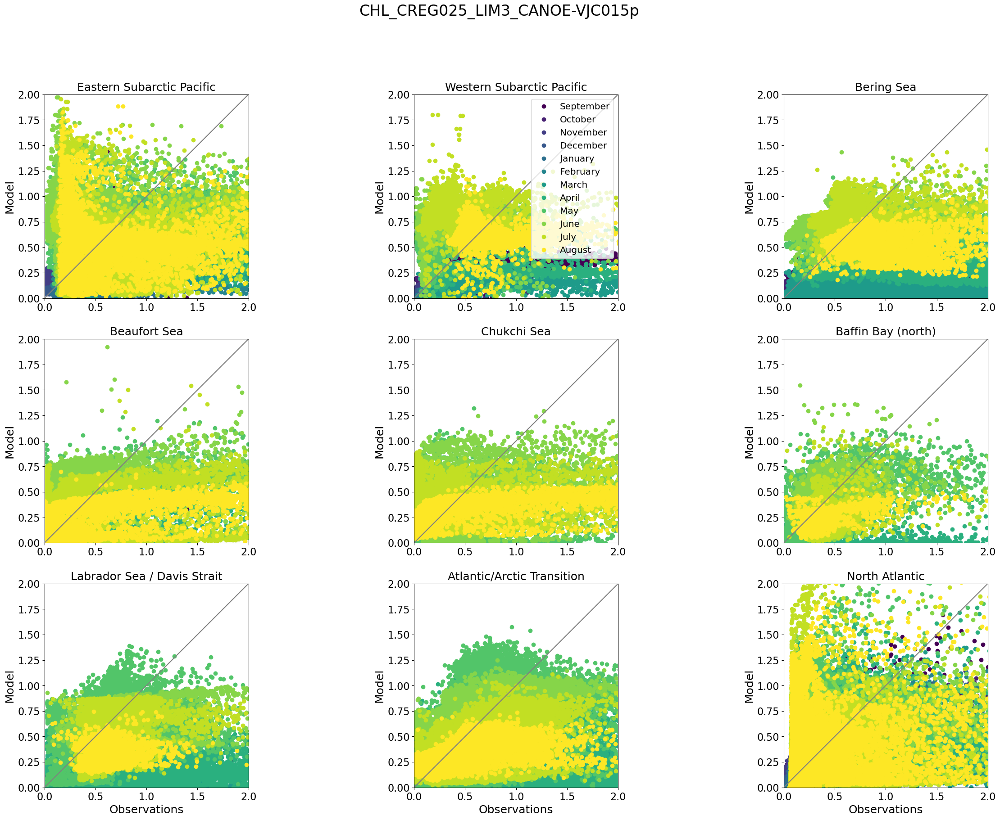

/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/tmp/ipykernel_814285/2638509405.py:61: DeprecationWarning: `np.bool` is a deprecated alias for the builtin 

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015q_monthly_chl.nc


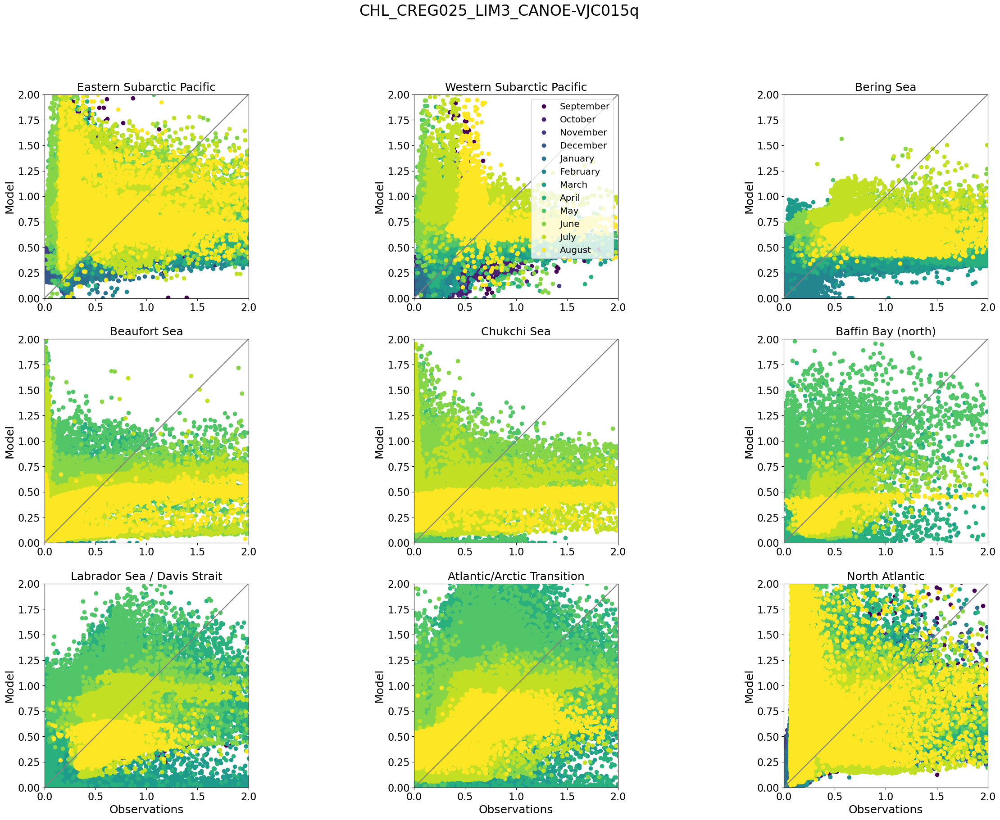

In [5]:
import itertools
fig, axes = plt.subplots(num=1, clear=True, nrows=3, ncols=3, figsize=(30, 20))

months=['September','October','November','December','January','February','March','April','May','June','July','August']
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
iz = np.arange(10)
#variants = ['CREG025_LIM3_CANOE-VJC014l','CREG025_LIM3_CANOE-VJC014t','CREG025_LIM3_CANOE-VJC014w',
#            'CREG025_LIM3_CANOE-VJC014x','CREG025_LIM3_CANOE-VJC014m','CREG025_LIM3_CANOE-VJC014n',
#            'CREG025_LIM3_CANOE-VJC014o','CREG025_LIM3_CANOE-VJC014p','CREG025_LIM3_CANOE-VJC014y',
#            'CREG025_LIM3_CANOE-VJC014q','CREG025_LIM3_CANOE-VJC014z','CREG025_LIM3_CANOE-VJC014r',
#            'CREG025_LIM3_CANOE-VJC014s','CREG025_LIM3_CANOE-VJC014u','CREG025_LIM3_CANOE-VJC014v',
#            'CREG025_LIM3_CANOE-VJC015a','CREG025_LIM3_CANOE-VJC015b','CREG025_LIM3_CANOE-VJC015c',
#            'CREG025_LIM3_CANOE-VJC015d','CREG025_LIM3_CANOE-VJC015e','CREG025_LIM3_CANOE-VJC015f',
#            'CREG025_LIM3_CANOE-VJC015g','CREG025_LIM3_CANOE-VJC015i','CREG025_LIM3_CANOE-VJC015j',
#            'CREG025_LIM3_CANOE-VJC015k','CREG025_LIM3_CANOE-VJC015l','CREG025_LIM3_CANOE-VJCnep01',
#            'CREG025_LIM3_CANOE-VJCsed01','CREG025_LIM3_CANOE-VJCsed02']

variants = ['CREG025_LIM3_CANOE-VJC015p','CREG025_LIM3_CANOE-VJC015q']

for asuff in variants:
    fig, axes = plt.subplots(num=1, clear=True, nrows=3, ncols=3, figsize=(30, 20))
    runid = str(asuff)
    data_all=np.zeros((12,ny,nx))
    fig.suptitle('CHL_'+asuff, fontsize=24)
    flist = glob.glob("/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/"+runid+"_monthly_chl.nc")
    flist.sort()
    ifile = 0
    for i, c, in enumerate(regions):
        cx=plt.subplot(3,3,i+1)
        colors =itertools.cycle(plt.get_cmap('viridis')(np.linspace(0,1, 12))) # potential pallettes: hsv, jet, gnuplot
        
        for im in np.arange(9,12):
            if im >= 0:
                
                filein = flist[ifile]
                data = Dataset(filein, "r", format="NETCDF4")
                modCHL = data.variables['tCHL'][:]
                tmaskz=tmask[iz,:,:].flatten()   
                ZZ=(np.zeros((10,ny,nx))+regindx).flatten()    # broadcast regions map into a 3D array with same data for each depth

                XOBS=obsCHL[im,:,:].squeeze().flatten()
                XMOD=modCHL[im,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];

                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]
                colour = next(colors) 
                plt.plot(XOBS[jj], XMOD[jj], "o", color=colour, markeredgecolor=colour, label=im)
            if i > 5:
                plt.xlabel("Observations", fontsize=18)
            plt.ylabel("Model", fontsize=18)
            plt.title(c, fontsize=18)
            plt.axis('square')
            cx.tick_params(axis='both', labelsize=16)
            cx.set_aspect(1./cx.get_data_ratio())
        for im in np.arange(0,9):
            if im >= 0:
                filein = flist[ifile]
                print(filein)
                data = Dataset(filein, "r", format="NETCDF4")
                modCHL = data.variables['tCHL'][:]
                tmaskz=tmask[iz,:,:].flatten()   
                ZZ=(np.zeros((10,ny,nx))+regindx).flatten()    # broadcast regions map into a 3D array with same data for each depth

                XOBS=obsCHL[im,:,:].squeeze().flatten()
                XMOD=modCHL[im,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];

                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]
                colour = next(colors) 
                plt.plot(XOBS[jj], XMOD[jj], "o", color=colour, markeredgecolor=colour, label=im)

            if i > 5:
                plt.xlabel("Observations", fontsize=18)

            plt.ylabel("Model", fontsize=18)
            plt.title(c, fontsize=18)
            plt.xlim([0, 2]); plt.ylim([0,2])
            cx.tick_params(axis='both', labelsize=16)
            cx.set_aspect(1./cx.get_data_ratio())
        cx.plot([0, 1], [0, 1], color='grey', transform=cx.transAxes)
        if i == 1:
            plt.legend(labels=['September','October','November','December','January','February','March','April','May','June','July','August'],
                       fontsize='x-large')
    
    plt.show()
    fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/Books/CHL/CHL_"+runid)
    #plt.close(fig)    

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0


/tmp/ipykernel_814285/387581452.py:47: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/home/fid000/WORK7/software/anaconda3/envs/pypkg/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/fid000/WORK7/software/anaconda3/envs/pypkg/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014t
['/home/fid000/WORK7/

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK

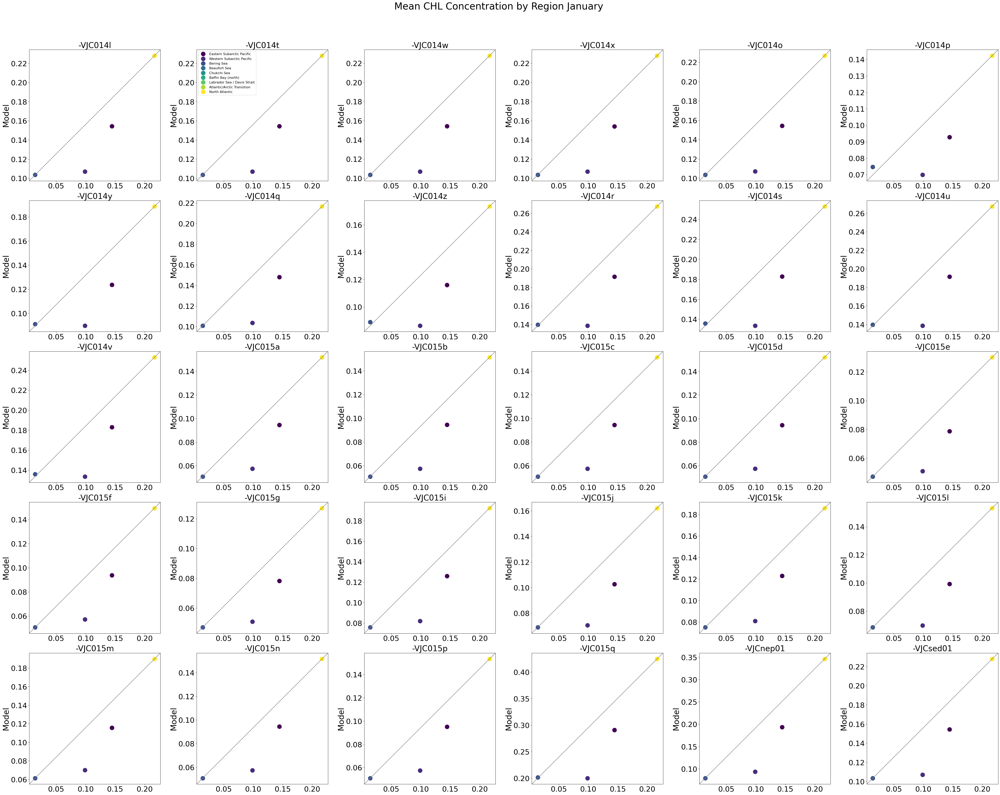

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK

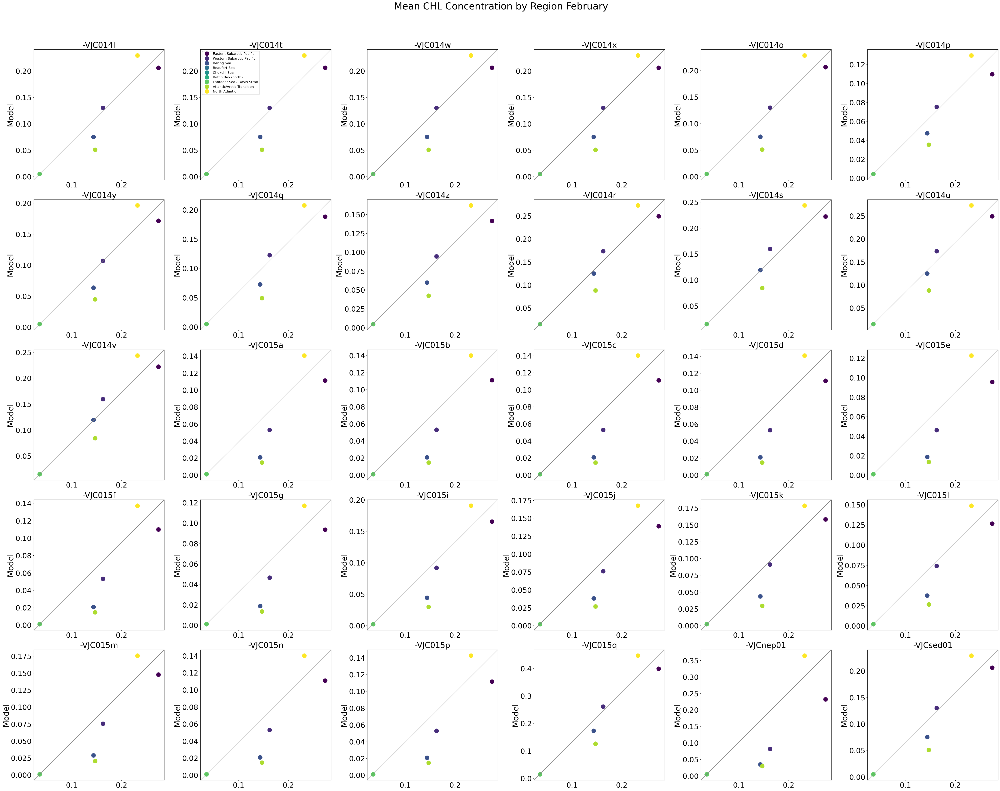

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/

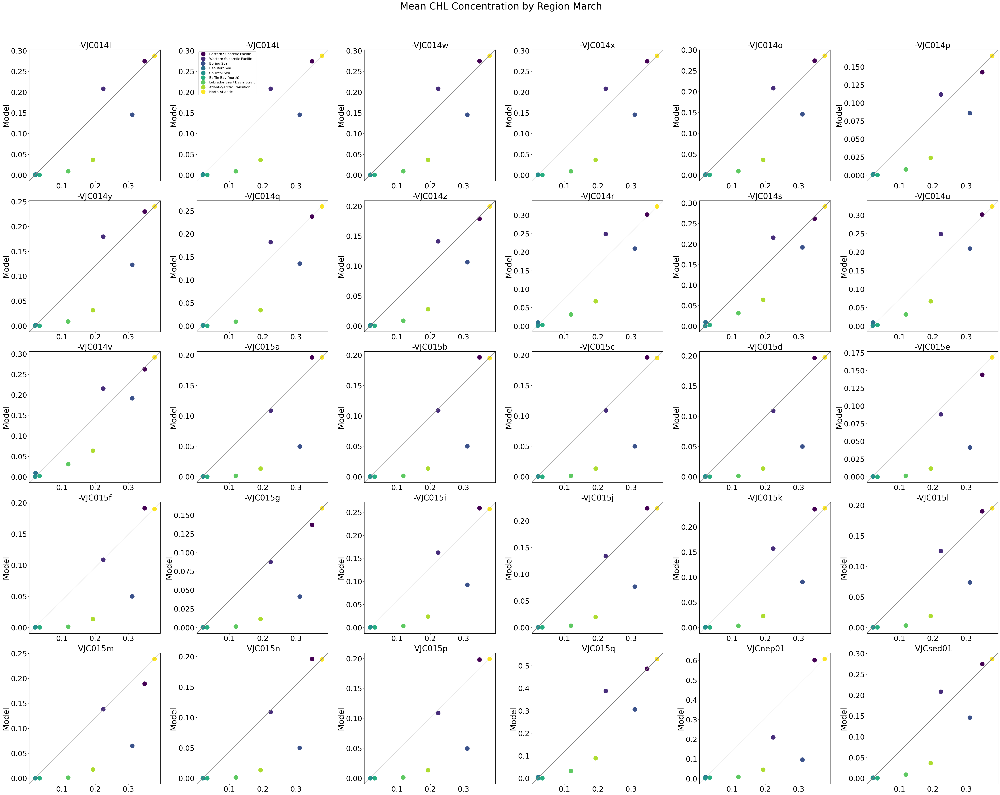

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014r
['/home/fid000/WORK7/

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK

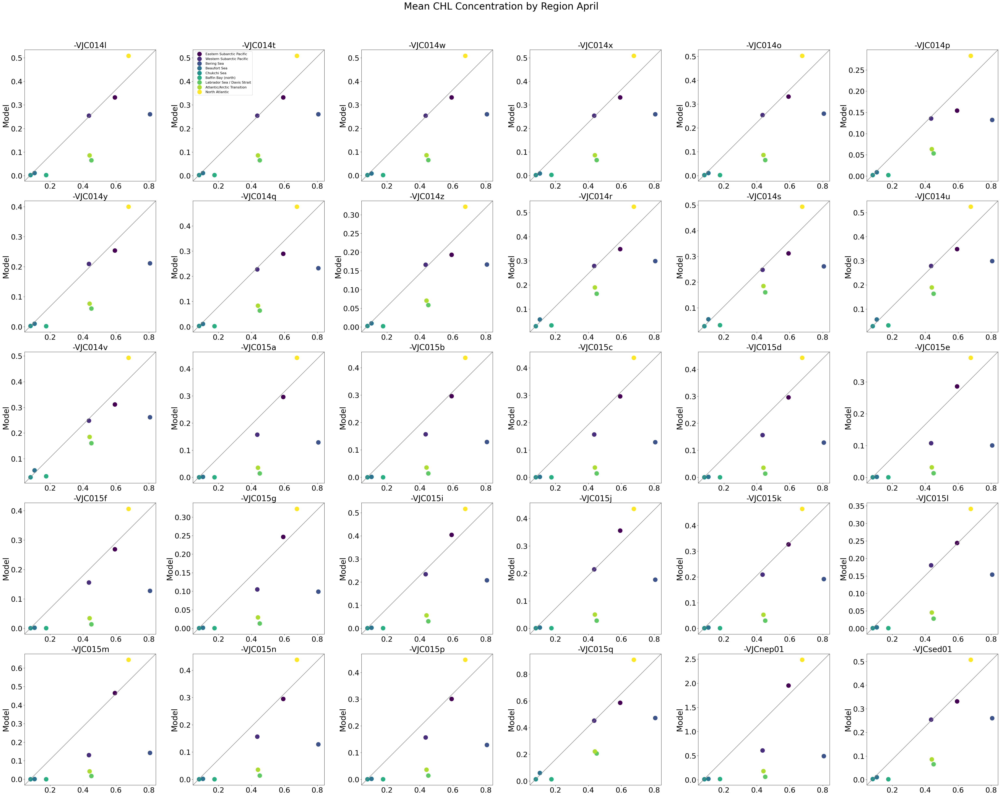

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/

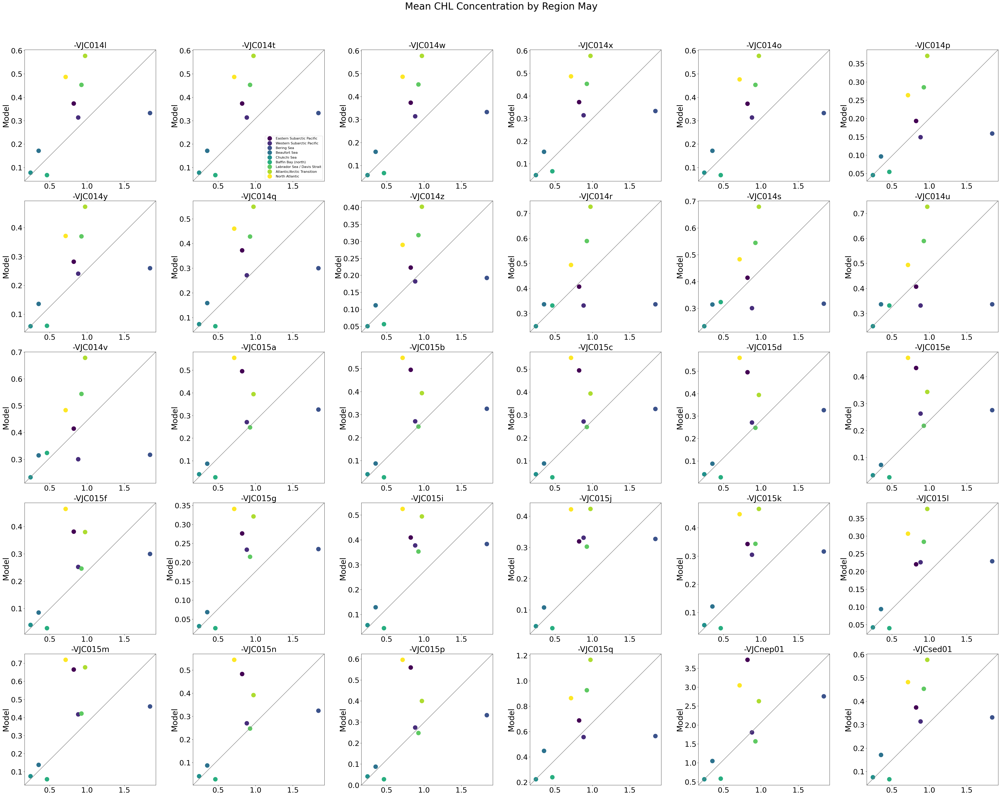

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK

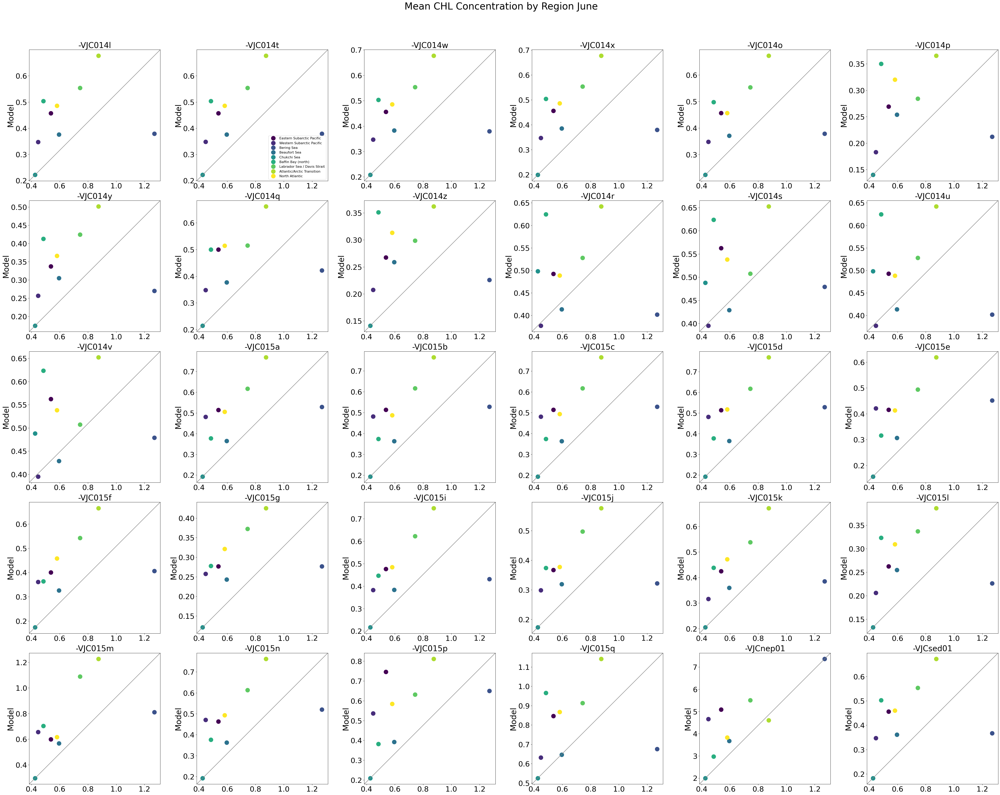

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK

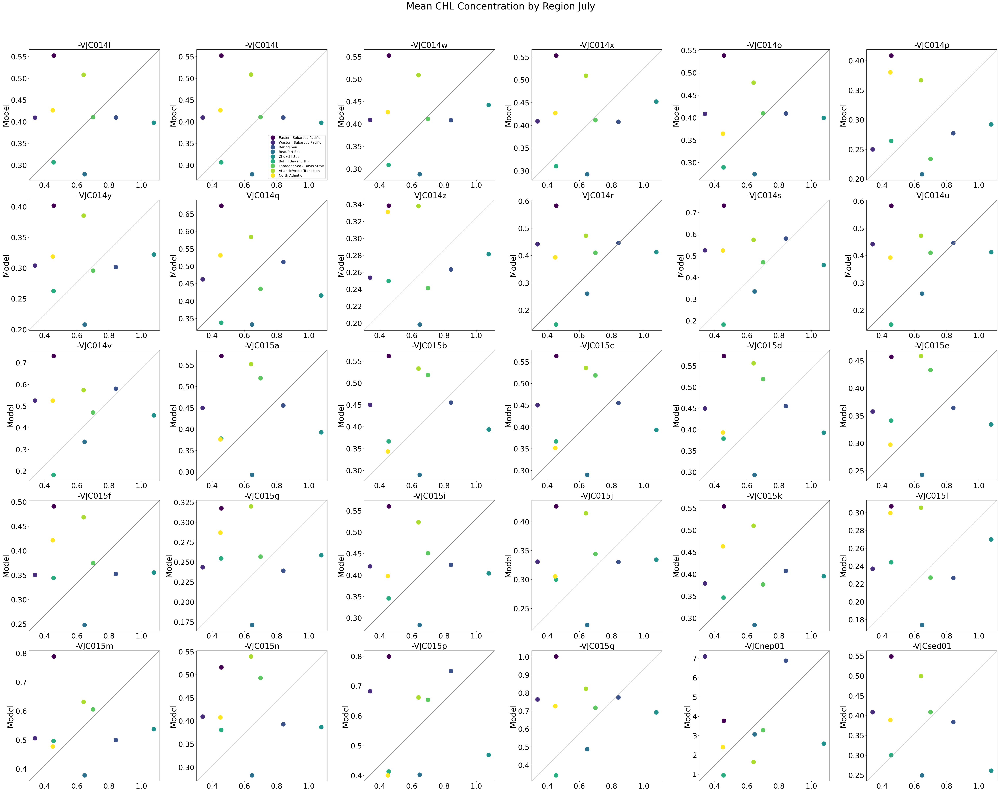

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK

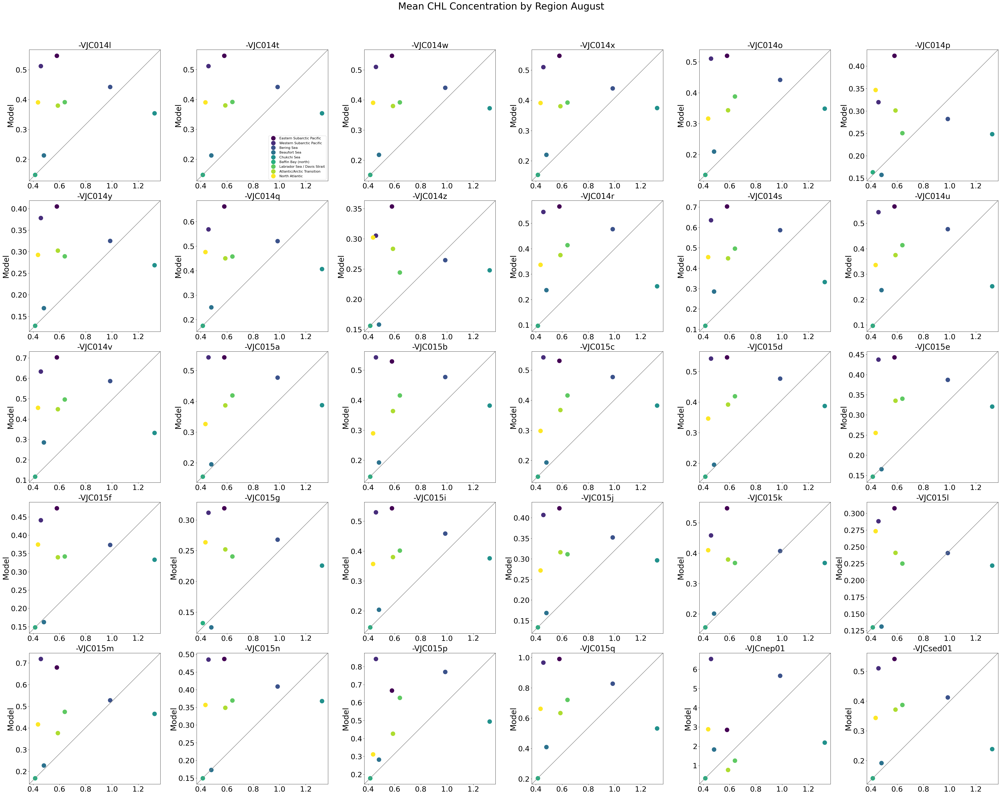

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK

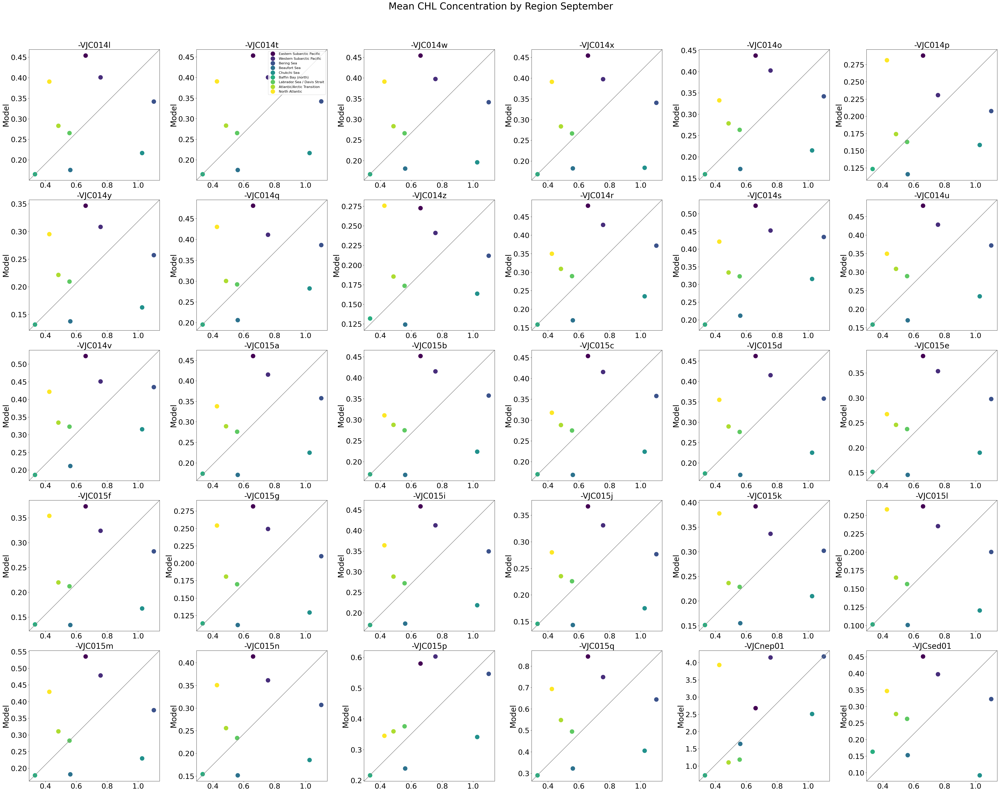

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc']
0
/home/fid000/WORK

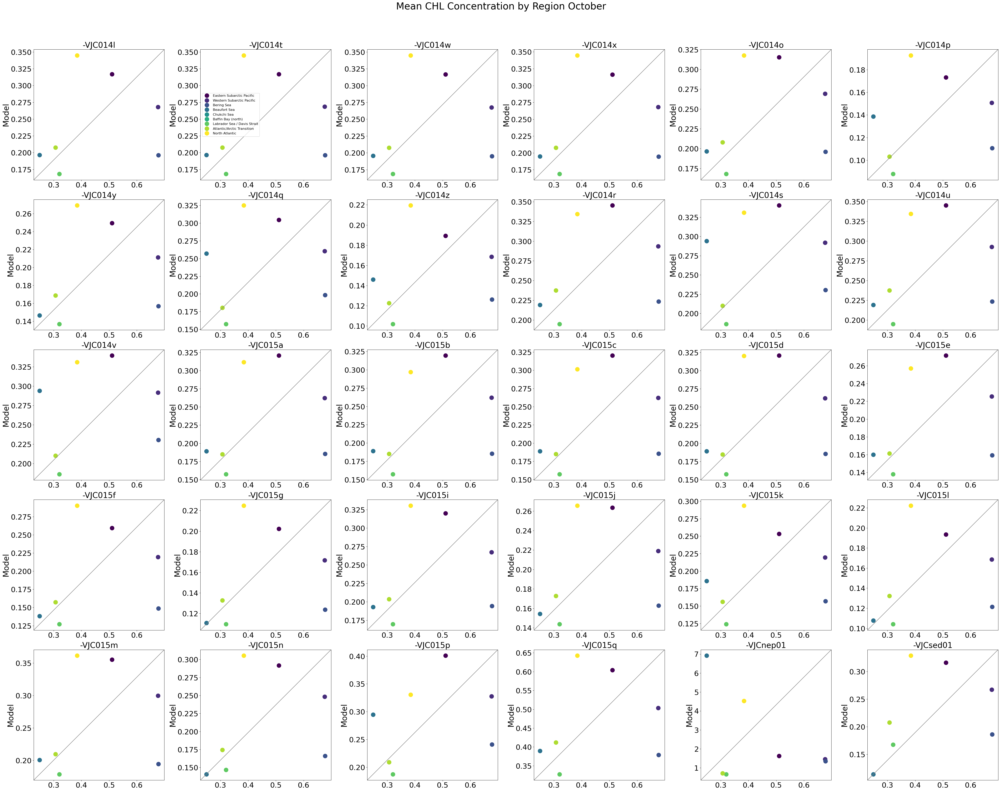

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK

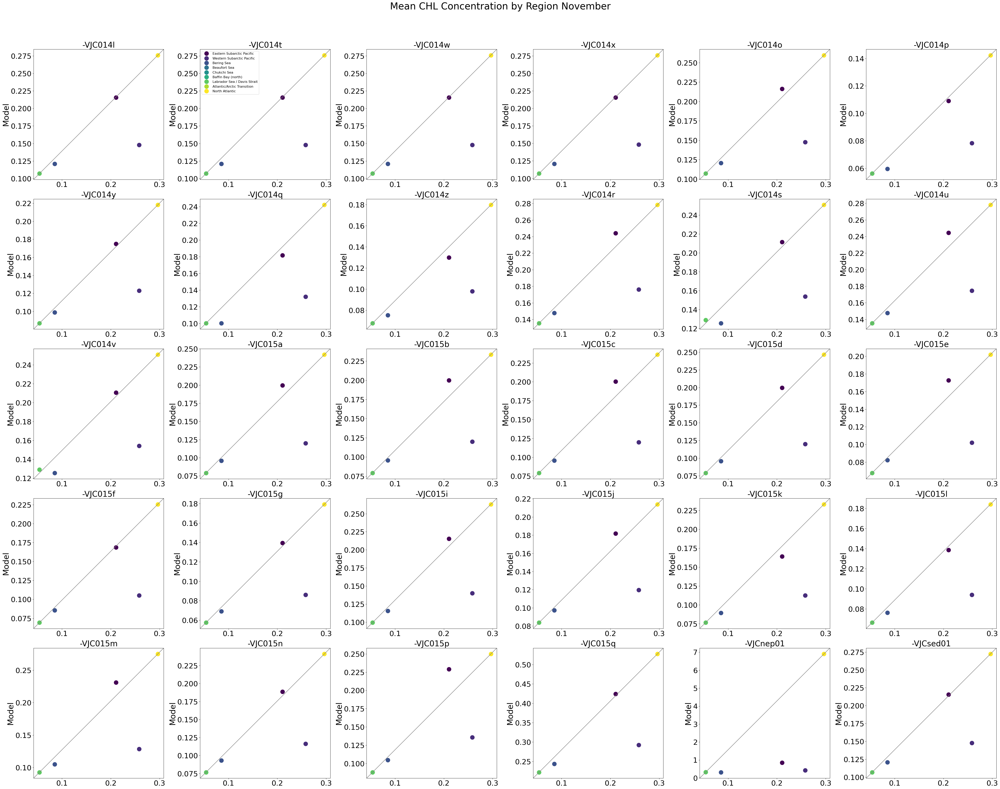

CREG025_LIM3_CANOE-VJC014l
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014l_monthly_chl.nc
0
/home/fid000/WO

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014q_monthly_chl.nc
CREG025_LIM3_CANOE-VJC014z
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC014z_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015c_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015d
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015d_monthly_chl.nc
0
/home/fid000/WORK

/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015l_monthly_chl.nc
CREG025_LIM3_CANOE-VJC015m
['/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc']
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/CREG025_LIM3_CANOE-VJC015m_monthly_chl.nc
0
/home/fid000/WORK

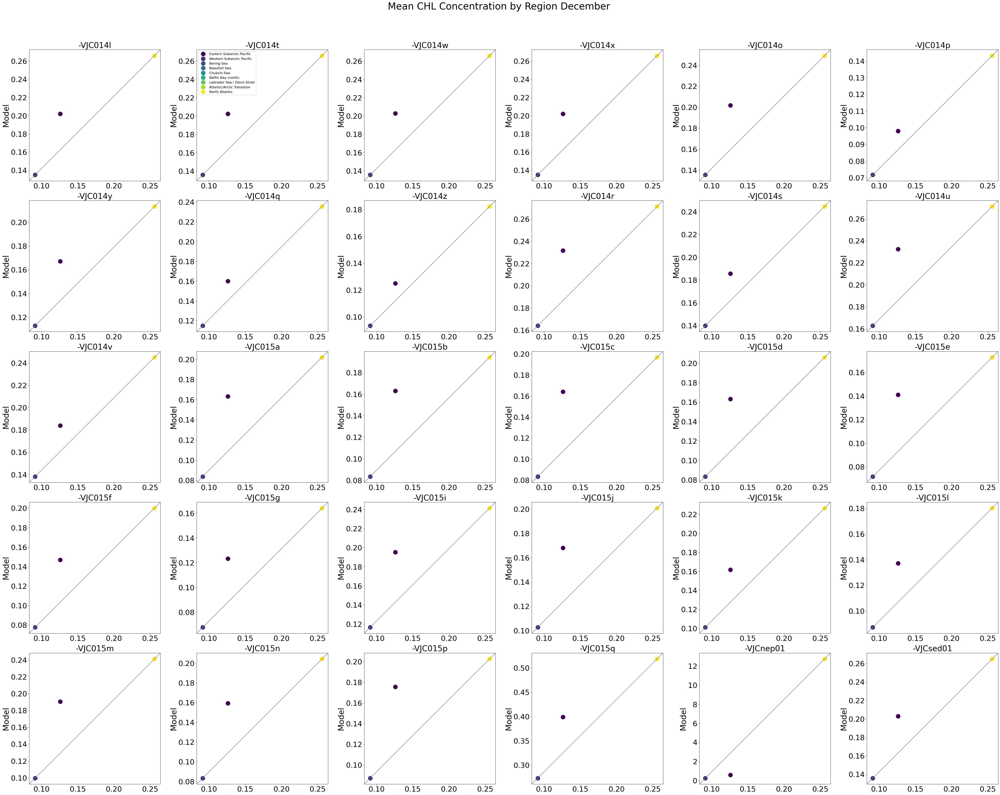

In [6]:
# July

#fig, axes = plt.subplots(num=1, clear=True, nrows=6, ncols=5, figsize=(30, 20))
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
import itertools
iz = np.arange(10)

months=['January','February','March','April','May','June','July','August','September','October','November','December']
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
variants = ['-VJC014l','-VJC014t','-VJC014w',
            '-VJC014x','-VJC014o','-VJC014p',
            '-VJC014y','-VJC014q','-VJC014z',
            '-VJC014r','-VJC014s','-VJC014u',
            '-VJC014v','-VJC015a','-VJC015b',
            '-VJC015c','-VJC015d','-VJC015e',
            '-VJC015f','-VJC015g','-VJC015i',
            '-VJC015j','-VJC015k','-VJC015l',
            '-VJC015m','-VJC015n','-VJC015p',
            '-VJC015q','-VJCnep01','-VJCsed01']


for im, mmon in enumerate(months):
    
    fig, axes = plt.subplots(num=1, clear=True, nrows=5, ncols=6, figsize=(50, 40))
    fig.suptitle('Mean CHL Concentration by Region '+mmon, fontsize=34) 
    
    for a, asuff in enumerate(variants):
        cx=plt.subplot(5,6, a+1)
        runid = str('CREG025_LIM3_CANOE'+asuff)
        print(runid)
        data_all=np.zeros((12,ny,nx))
        flist = glob.glob("/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/"+runid+"_monthly_chl.nc")
        flist.sort()
        print(flist)
        ifile = 0
        colors =itertools.cycle(plt.get_cmap('viridis')(np.linspace(0,1, 9))) # potential pallettes: hsv, jet, gnuplot
            
        for i, c in enumerate(regions): 
            
            if i >= 0:
                
                #ifile=ifile+1
                print(ifile)
                filein = flist[ifile]
                #print(filein)
                data = Dataset(filein, "r", format="NETCDF4")
                modCHL = data.variables['tCHL'][:]

                tmaskz=tmask[iz,:,:].flatten()
                ZZ=(np.zeros((10,ny,nx))+regindx).flatten()    # broadcast regions map into a 3D array with same data for each depth
                XOBS=obsCHL[im,:,:].squeeze().flatten()
                XMOD=modCHL[im,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];
                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]                          
              
                XOBS=np.mean(XOBS[jj]); XMOD=np.mean(XMOD[jj])
                
                colour = next(colors) 
                plt.plot(XOBS, XMOD, "o", color=colour, markeredgecolor=colour, markersize=15, label=regions)
                print(filein)

            #if i > 5:
            #    plt.xlabel("Observations", fontsize=18)
            plt.ylabel("Model", fontsize=28)
            plt.title(asuff, fontsize=28)
            #plt.xlim([0, 2]); plt.ylim([0,2])
            cx.tick_params(axis='both', labelsize=26)
            cx.set_aspect(1./cx.get_data_ratio())
            if a ==1:
                plt.legend(labels=['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic'],
                           fontsize='large')
        cx.plot([0, 1], [0, 1], color='grey', transform=cx.transAxes)
        
            
    plt.tight_layout(rect=(0,0,1,0.95), w_pad=0)
    plt.show()
    fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/Means/CHL_/chl_month"+str("{:02d}".format(im+1)))

/tmp/ipykernel_130273/1655478547.py:38: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modCHL = data.variables['tCHL'][:]
/home/fid000/WORK7/software/anaconda3/envs/pypkg/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/fid000/WORK7/software/anaconda3/envs/pypkg/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


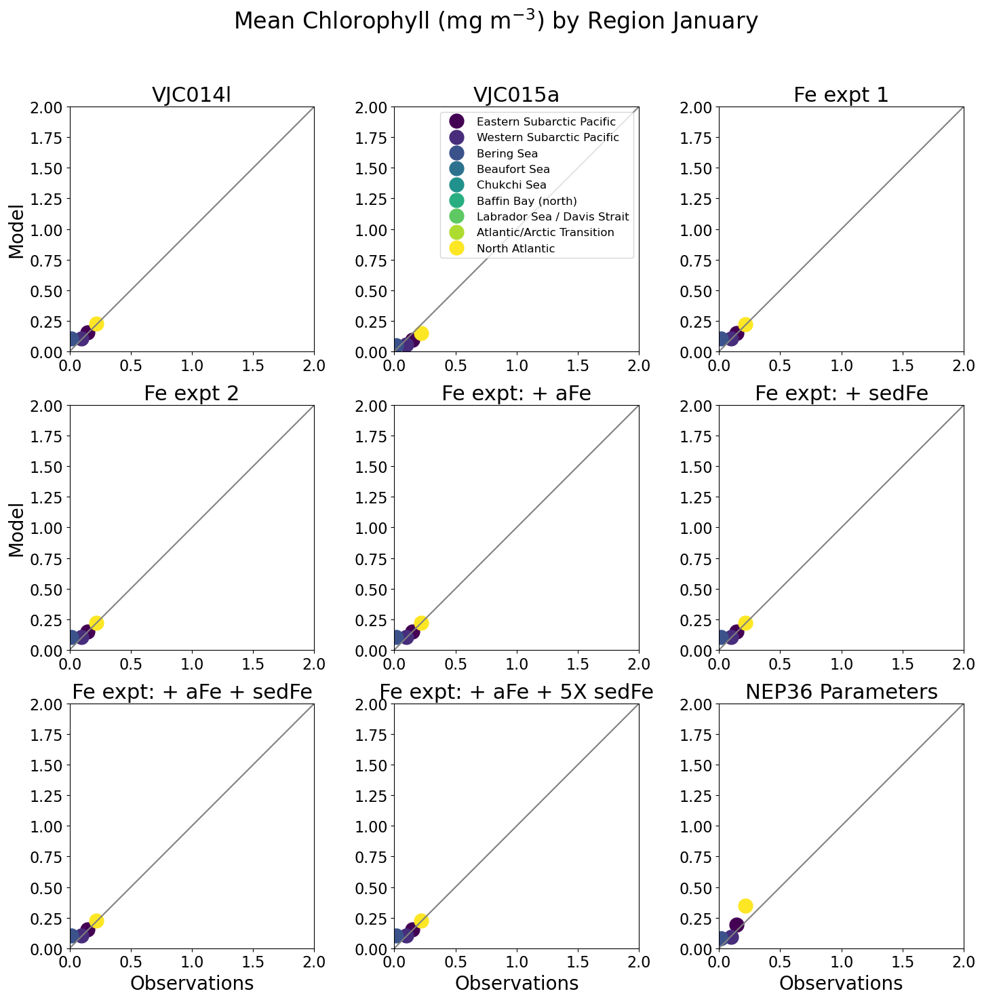

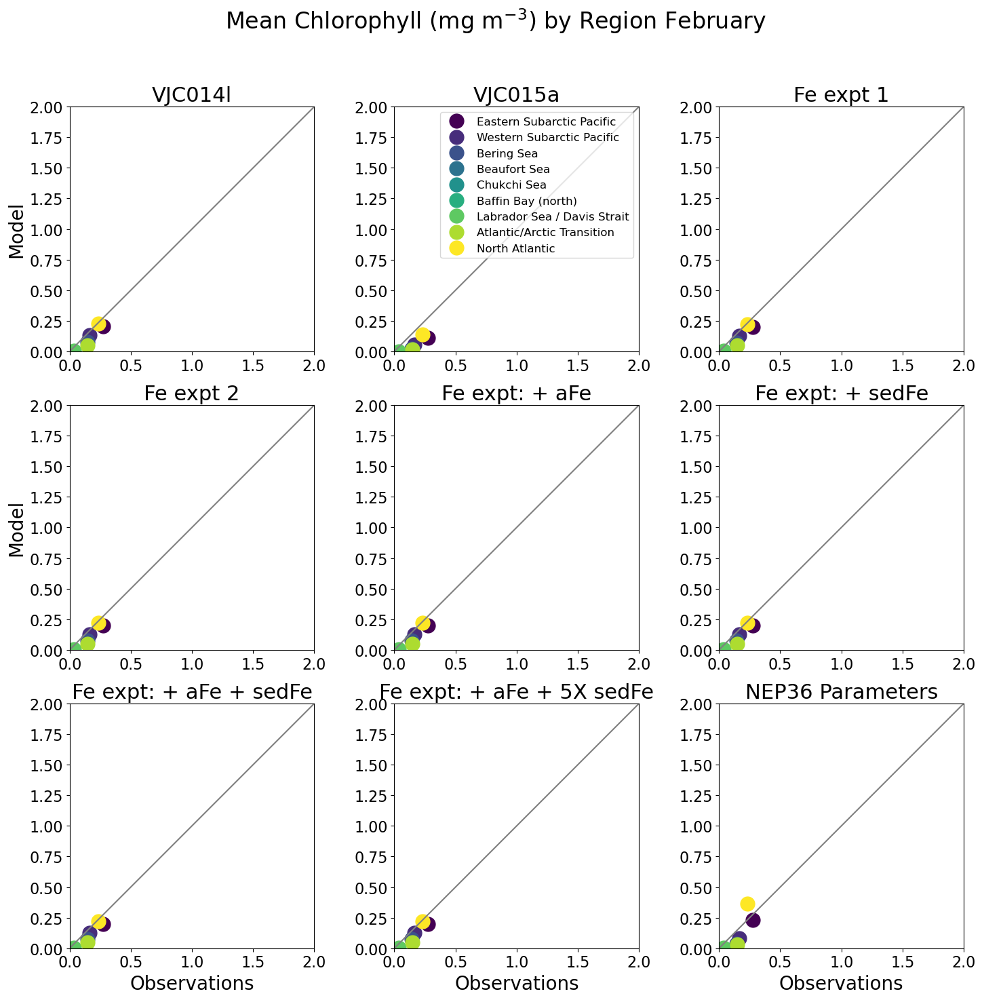

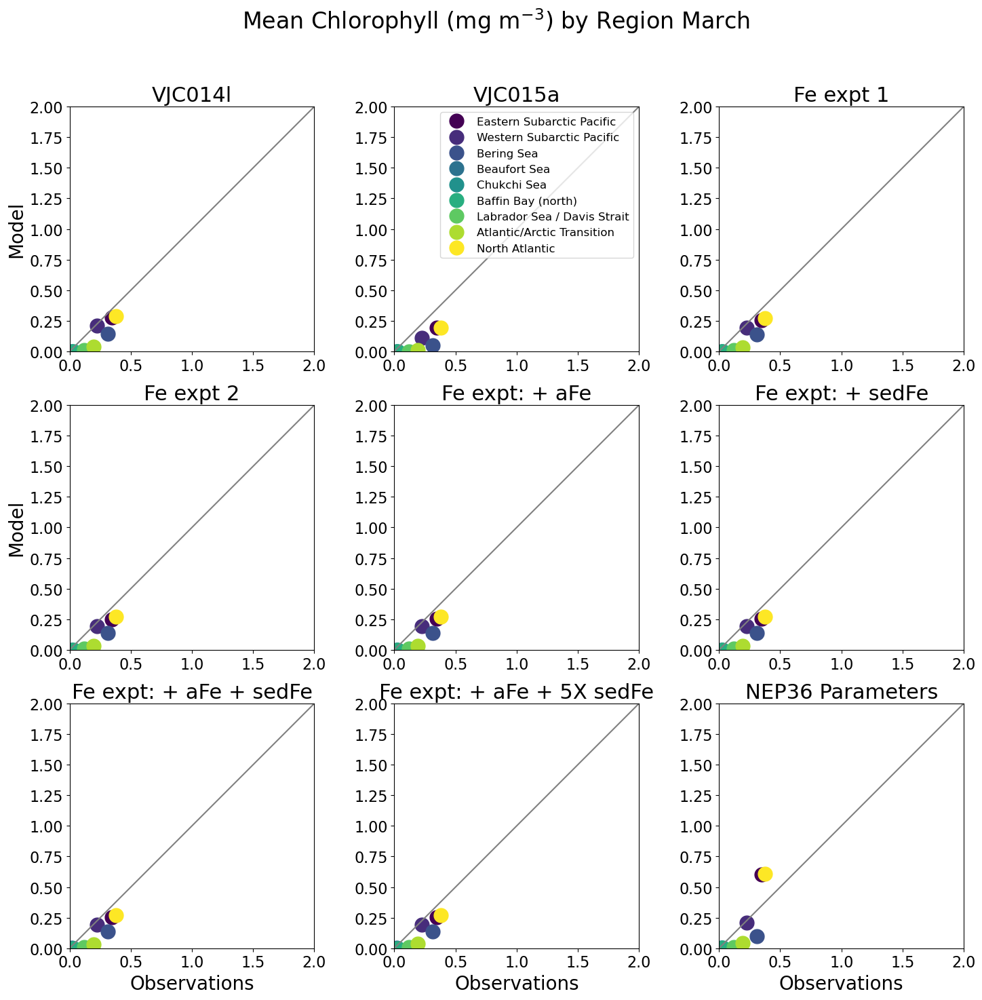

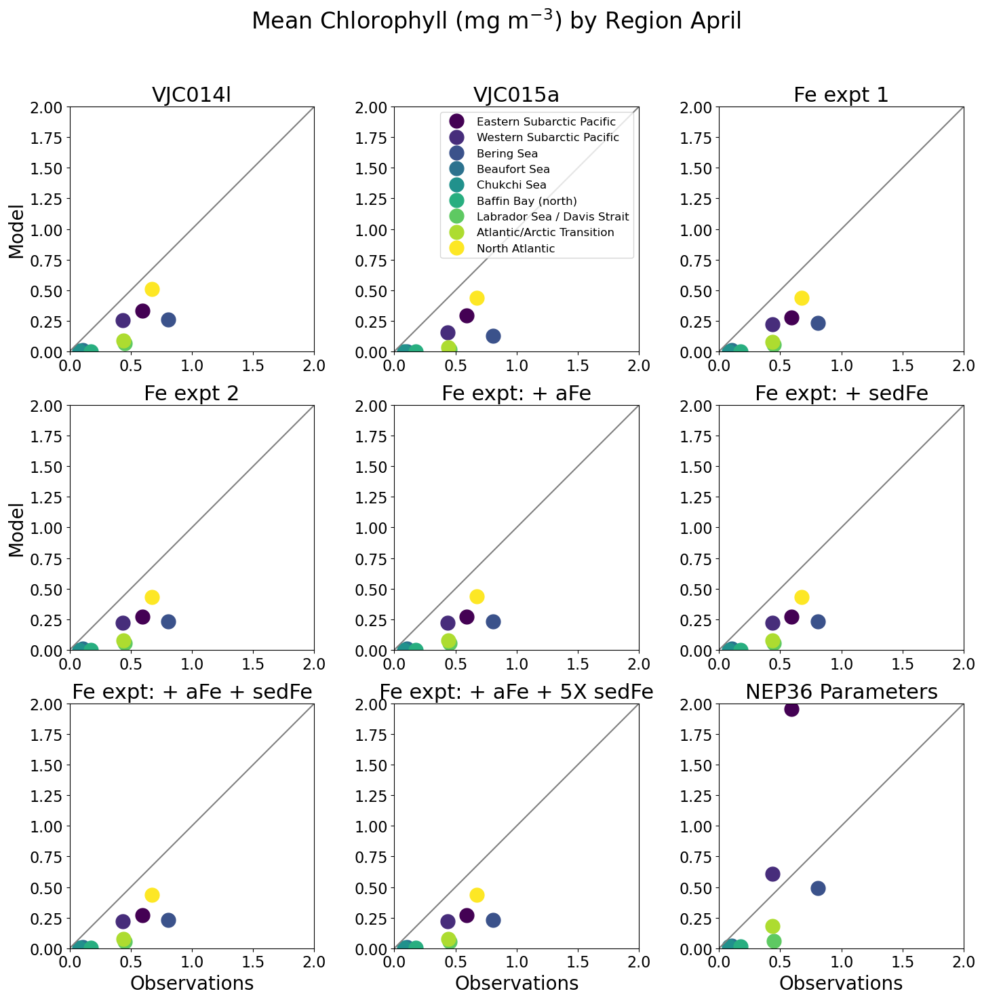

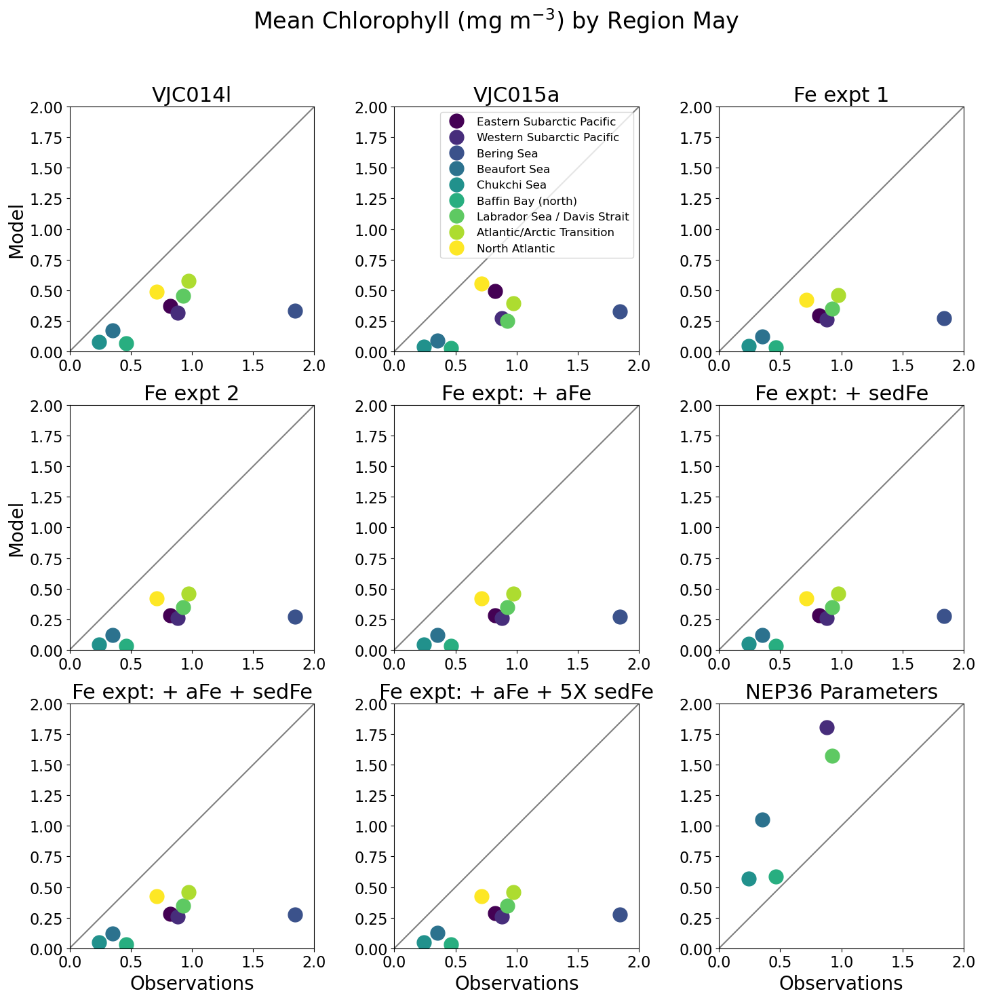

...

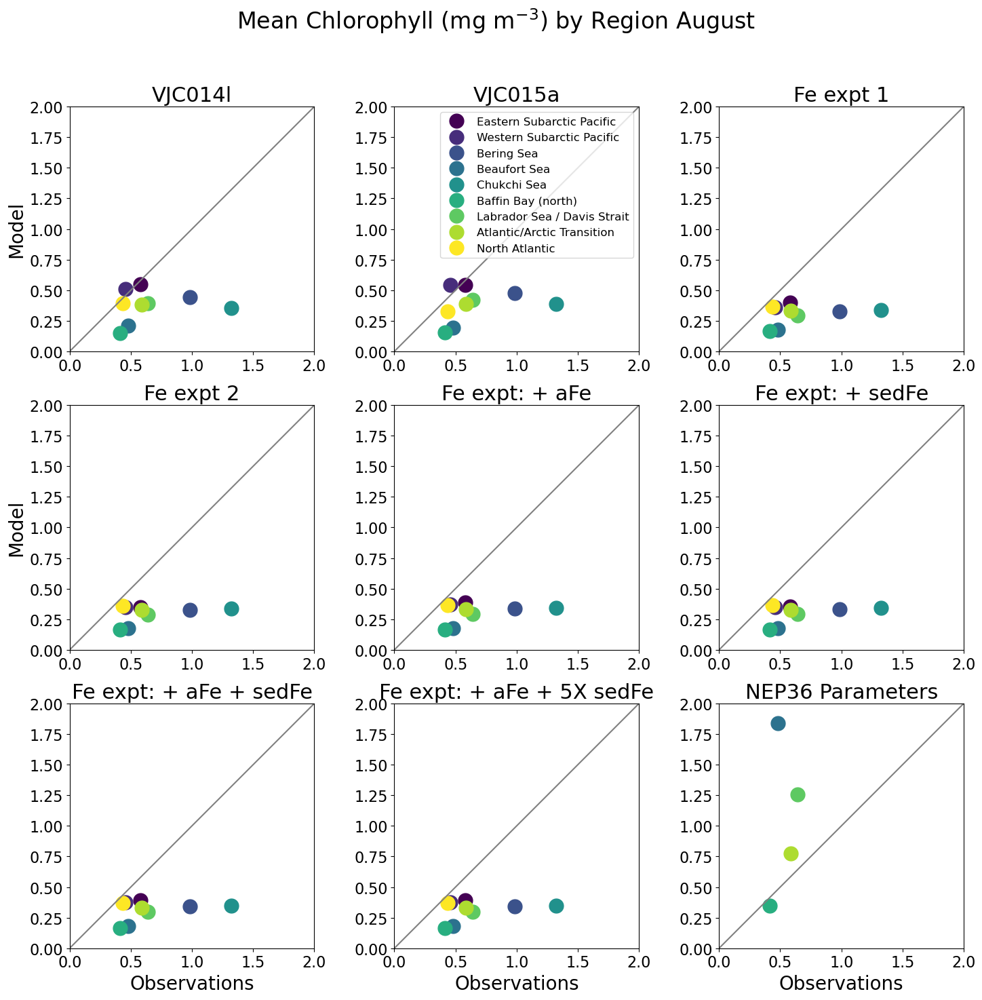

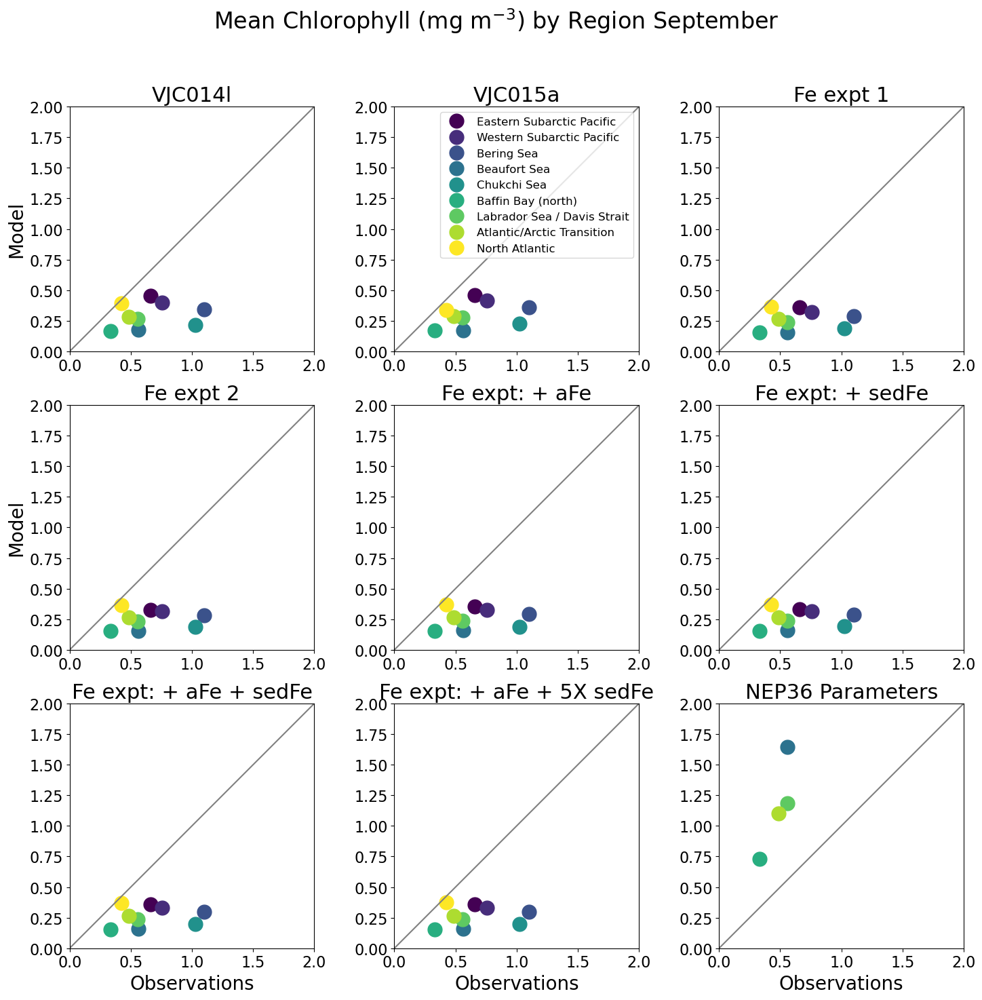

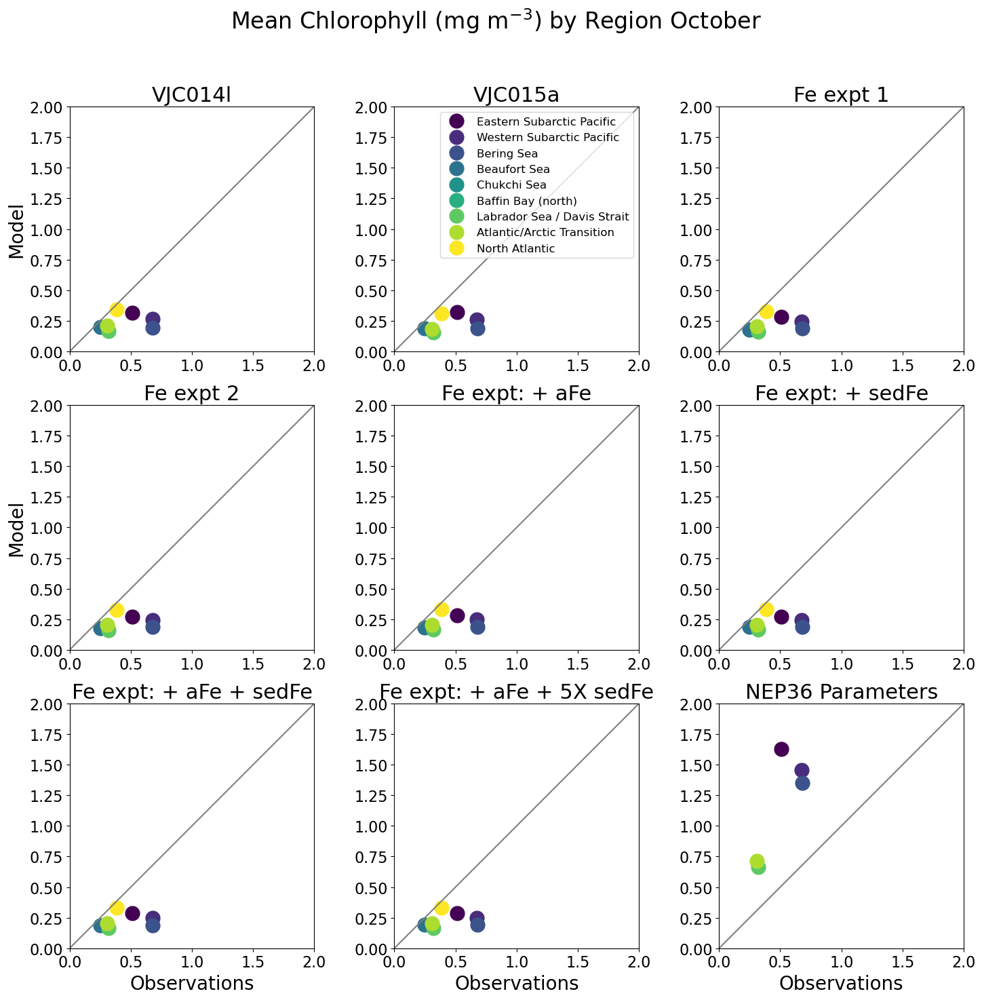

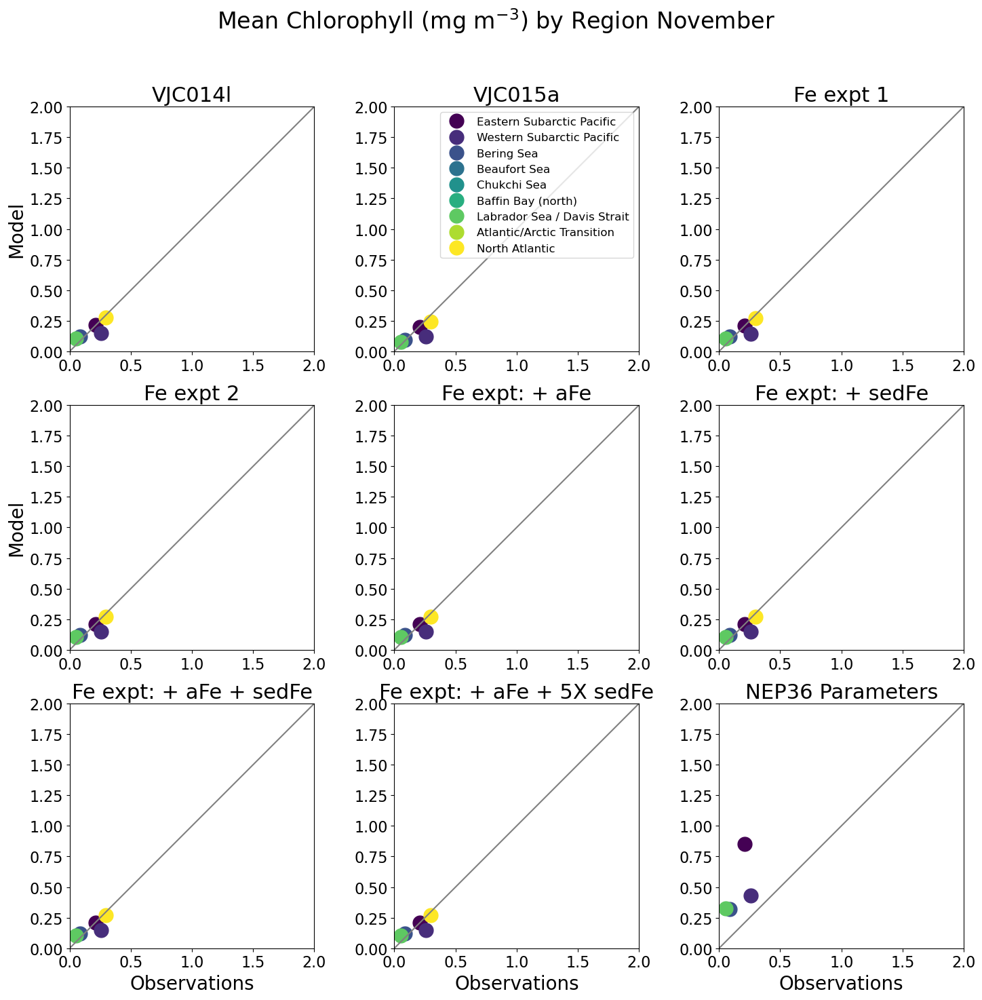

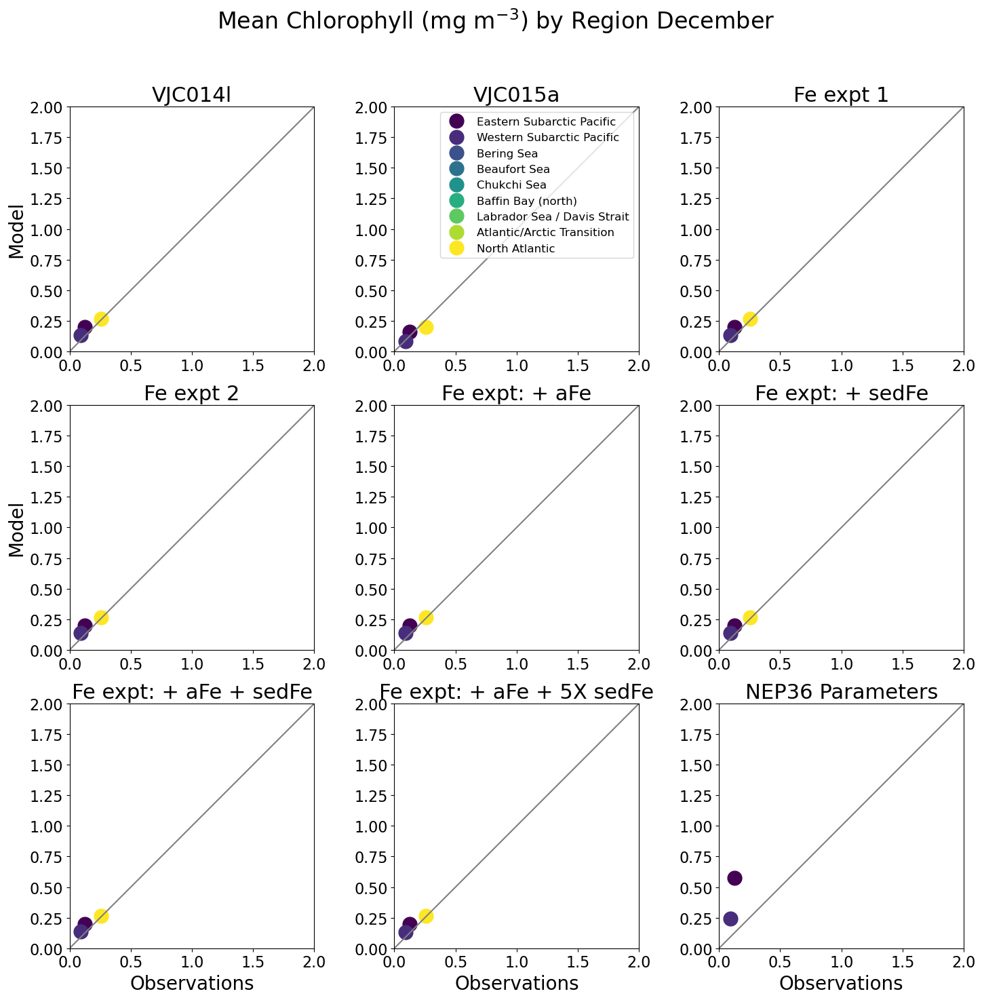

In [17]:
# Presentation quality plot for BioMod Workshop

#fig, axes = plt.subplots(num=1, clear=True, nrows=6, ncols=5, figsize=(30, 20))
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
import itertools
iz = np.arange(10)

months=['January','February','March','April','May','June','July','August','September','October','November','December']
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
variants = ['-VJC014l','-VJC015a','-VJC015oi','-VJC015ol','-VJC015on','-VJC015or','-VJC015os','-VJC015ot','-VJCnep01']

#variantdict = ['-VJC014l','-VJC015t','-VJC015u','-VJC015v','-VJC015w','-VJCnep01']
variantdict = ['VJC014l','VJC015a','Fe expt 1','Fe expt 2','Fe expt: + aFe','Fe expt: + sedFe','Fe expt: + aFe + sedFe',
               'Fe expt: + aFe + 5X sedFe','NEP36 Parameters']

for im, mmon in enumerate(months):
    
    fig, axes = plt.subplots(num=1, clear=True, nrows=3, ncols=3, figsize=(15, 15))
    fig.suptitle('Mean Chlorophyll (mg m$^{-3}$) by Region '+mmon, fontsize=24) 
    #fig.suptitle('Surface Chlorophyll Concentration (mg m$^{-3}$) by Region '+mmon, fontsize=24) 
    for a, asuff in enumerate(variants):
        cx=plt.subplot(3,3, a+1)
        runid = str('CREG025_LIM3_CANOE'+asuff)
        #print(runid)
        data_all=np.zeros((12,ny,nx))
        flist = glob.glob("/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/CHL/"+runid+"_monthly_chl.nc")
        flist.sort()
        #print(flist)
        ifile = 0
        colors =itertools.cycle(plt.get_cmap('viridis')(np.linspace(0,1, 9))) # potential pallettes: hsv, jet, gnuplot

        for i, c in enumerate(regions): 
            
            if i >= 0:
                
                filein = flist[ifile]
                data = Dataset(filein, "r", format="NETCDF4")
                modCHL = data.variables['tCHL'][:]

                tmaskz=tmask[iz,:,:].flatten()
                ZZ=(np.zeros((10,ny,nx))+regindx).flatten()    # broadcast regions map into a 3D array with same data for each depth
                XOBS=obsCHL[im,:,:].squeeze().flatten()
                XMOD=modCHL[im,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];
                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]
                XOBS=np.mean(XOBS[jj]); XMOD=np.mean(XMOD[jj])
                
                colour = next(colors) 
                #plt.plot(XOBS[jj], XMOD[jj], "o", color=colour, markeredgecolor=colour, label=regions)

                plt.plot(XOBS, XMOD, "o", color=colour, markeredgecolor=colour, markersize=15, label=regions)
            
            plt.ylim([0,2]); plt.xlim([0,2])
            cx.tick_params(axis='both', labelsize=16)
            cx.set_aspect(1./cx.get_data_ratio())
            #plt.xticks([200,400,600,800,1000]);plt.yticks([200,400,600,800,1000])
            plt.title(variantdict[a], fontsize=22)

            if a ==1:
                plt.legend(labels=['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic'],
                           fontsize='large')#, loc = 'lower right')
                
            if (a == 0) or (a == 3):
                plt.ylabel("Model", fontsize=20)

            if (a == 6) or (a == 7) or (a == 8):
                plt.xlabel("Observations", fontsize=20)

        cx.plot([0, 1], [0, 1], color='grey', transform=cx.transAxes)
            
    plt.tight_layout(rect=(0,0,1,0.95), w_pad=0)
    plt.show()
    fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PresentationFigures/CHL_FE/chl_means_month"+str("{:02d}".format(im+1)))
    #fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PresentationFigures/CHL_FE/chl_month"+str("{:02d}".format(im+1)))